In [1]:
import torch
from sklearn.model_selection import train_test_split

# load data from data folder(we"re in notebooks folder)
sim_arr_tensor = torch.load('./data/sim_arr_tensor.pt')

# train test split
train_data, test_data = train_test_split(
    sim_arr_tensor, test_size=0.2, random_state=42)
train_data, val_data = train_test_split(
    train_data, test_size=0.2, random_state=42)

/tmp/ipykernel_2251897/1126774367.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  sim_arr_tensor = torch.load('./data/sim_arr_tensor.pt')


In [2]:
from torch import nn

num_layers = 5
poolsize = [2, 2, 2, 2, 5]
channels = [3, 12, 7, 7, 11, 12]
kernel_sizes = [15, 10, 14, 14, 14]
dilations = [5, 5, 3, 3, 1]
activations = [nn.SiLU, nn.Tanh, nn.Softplus, nn.SiLU, nn.SiLU]
learning_rate = 0.0002568457560593339
batch_size = 32
epochs = 400

/home/tummalas/hyper-param-optim-4-vector-field-clustering/models/train_VaDE.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  sim_arr_tensor = torch.load('./data/sim_arr

Epoch 1/400
              Train Loss: 23301.4168
              Val Loss: 21925.4943
              KL Loss: 10062.8425
              Recon Loss: 13238.5744
            
Epoch 2/400
              Train Loss: 21819.1685
              Val Loss: 21027.4819
              KL Loss: 8592.1064
              Recon Loss: 13227.0621
            
Epoch 3/400
              Train Loss: 20981.9399
              Val Loss: 20504.5551
              KL Loss: 7765.0430
              Recon Loss: 13216.8970
            
Epoch 4/400
              Train Loss: 20528.9517
              Val Loss: 19588.9030
              KL Loss: 7356.6063
              Recon Loss: 13172.3454
            
Epoch 5/400
              Train Loss: 19826.7506
              Val Loss: 19259.7810
              KL Loss: 6674.6393
              Recon Loss: 13152.1113
            
Epoch 6/400
              Train Loss: 19755.1189
              Val Loss: 19178.2603
              KL Loss: 6607.3504
              Recon Loss: 13147.7685
          

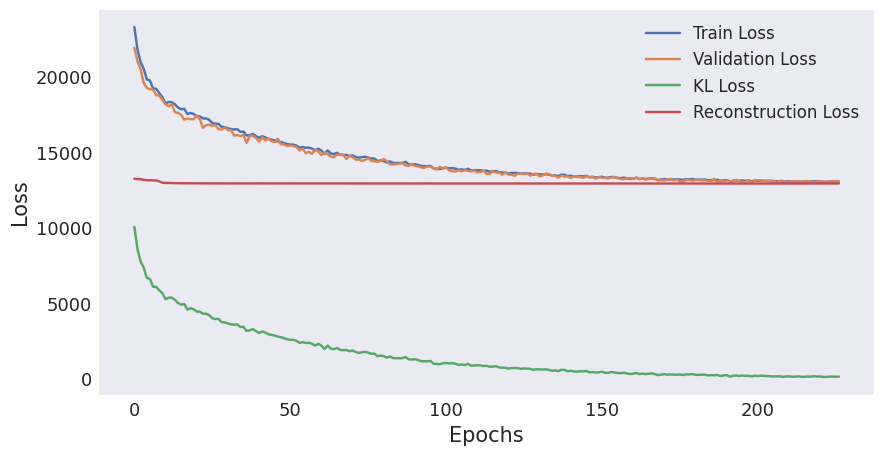

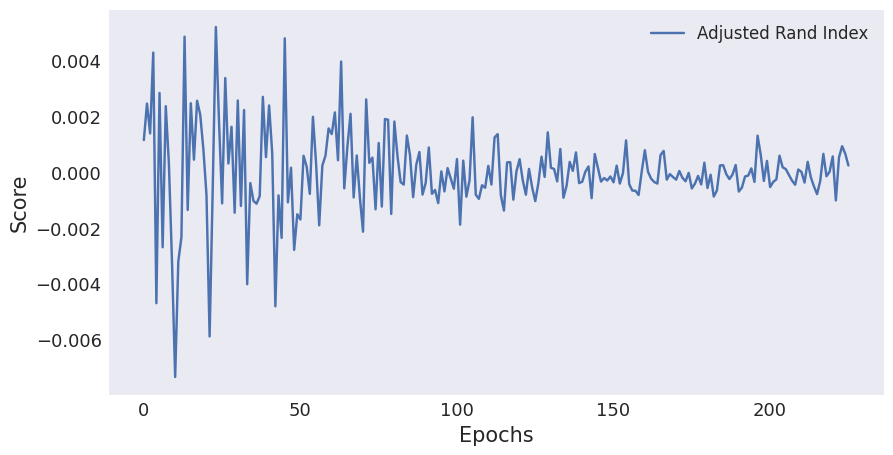

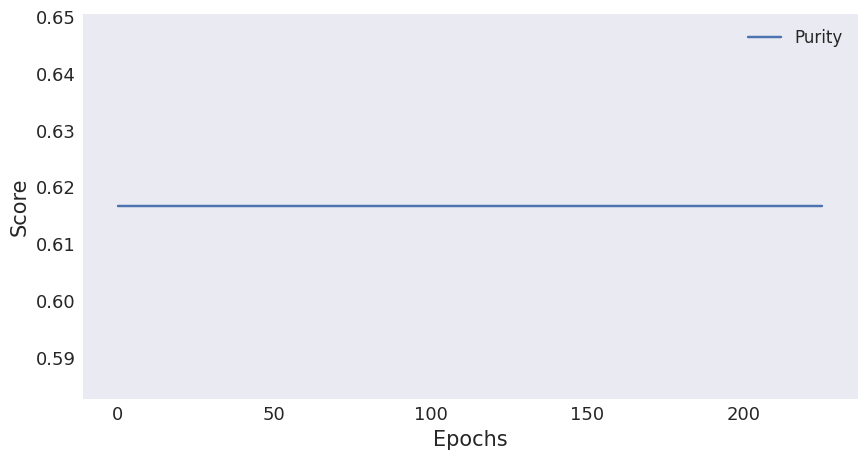

In [3]:
from models import variational
from models import train_vade, evaluate

encoder = variational.Encoder(num_layers, poolsize, channels,
                          kernel_sizes, dilations, activations)
decoder = variational.Decoder(encoder)
model = variational.DeepEmbedding(encoder, decoder, 15)

train_vade(model, train_data, val_data,
      lr=learning_rate,
      batch_size=batch_size,
      epochs=epochs)
# model = torch.load('./saved_models/variational_model.pt')
# evaluate(model, test_data,
#         batch_size=batch_size)

torch.save(model, './saved_models/vade_model.pt')

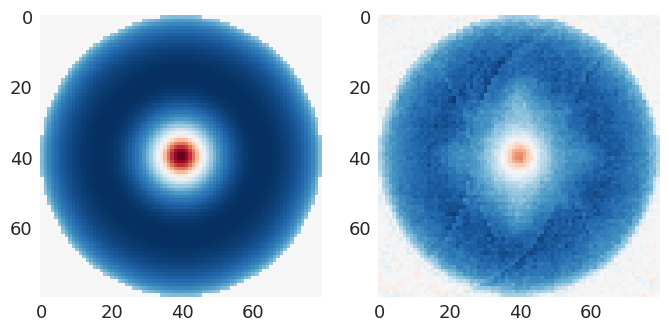

5_skyrmions


In [4]:
from plot import random_recon
random_recon(model, test_data)

In [5]:
from cluster_acc import purity, adj_rand_index

feature_array = model.feature_array(sim_arr_tensor)

labels = model.classify(sim_arr_tensor.to('cuda'))
labels = labels.cpu().detach().numpy()

print(f'Purity: {purity(labels)}')
print(f'ARI: {adj_rand_index(labels)}')

Purity: 0.6166112956810631
ARI: -0.00033199058146589735


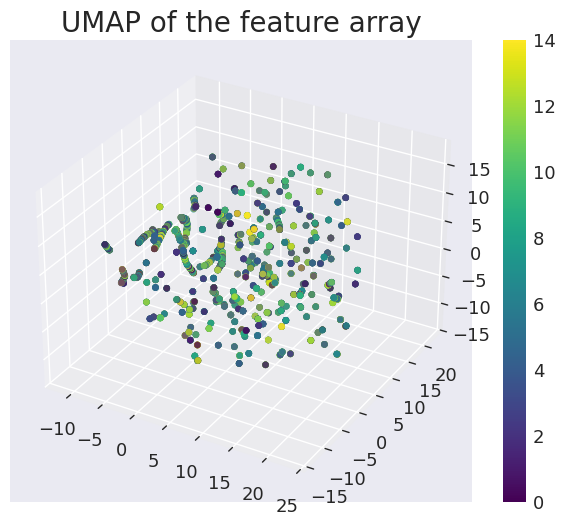

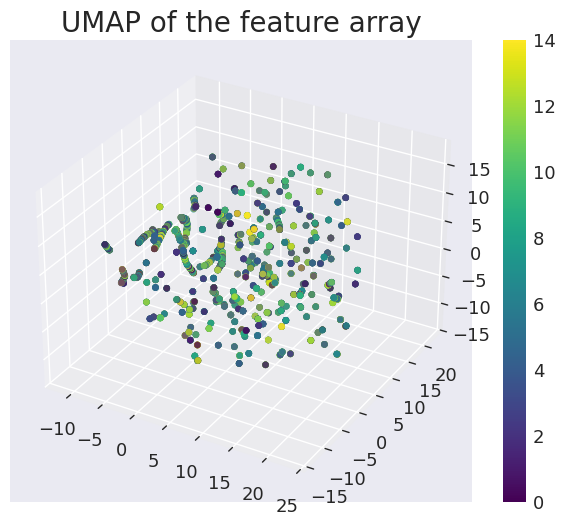

In [6]:
from plot import umap_plot
umap_plot(feature_array, labels)

In [7]:
from plot import class_config
class_config(labels)

Number of classes:  15


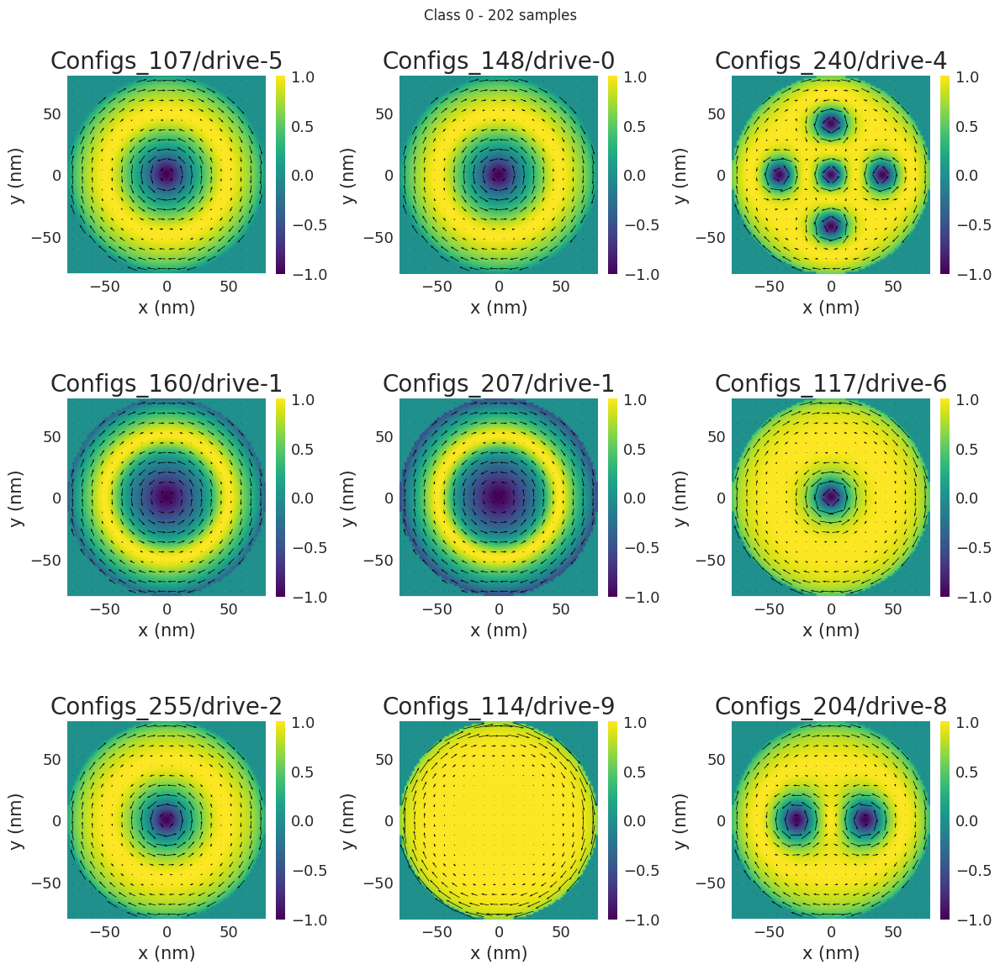

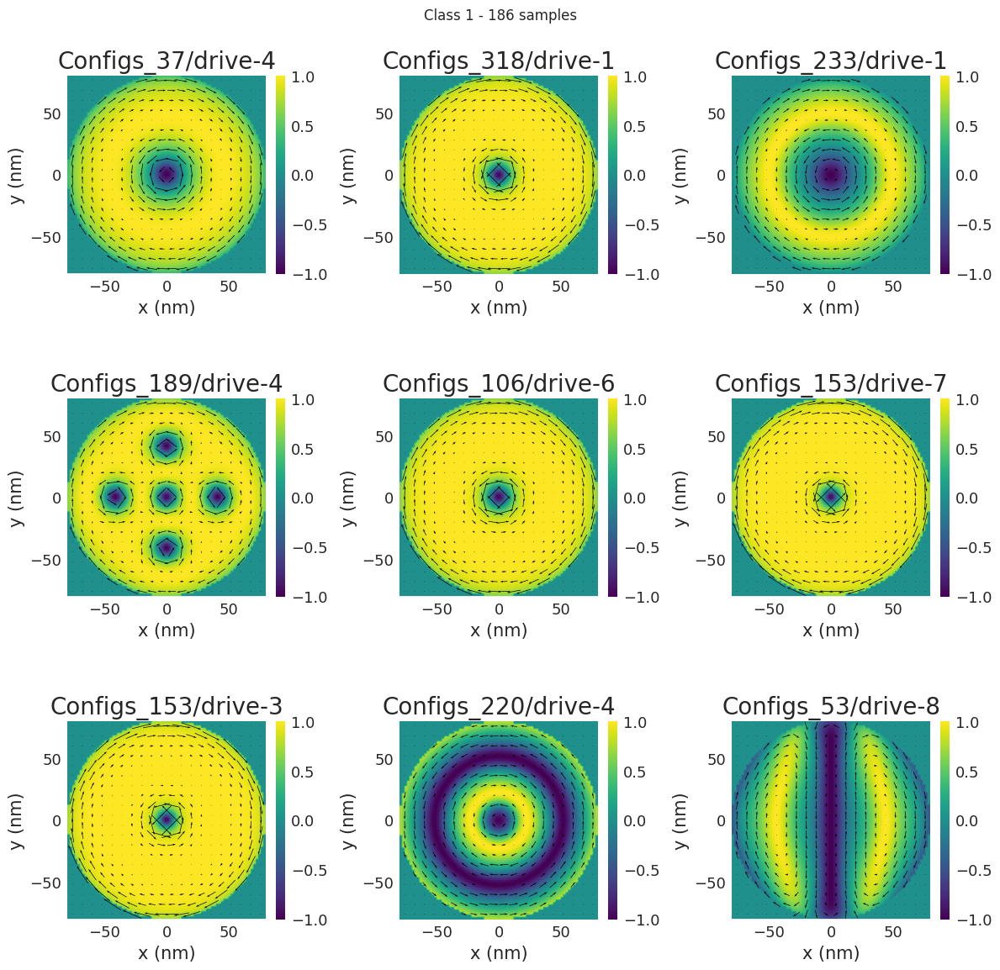

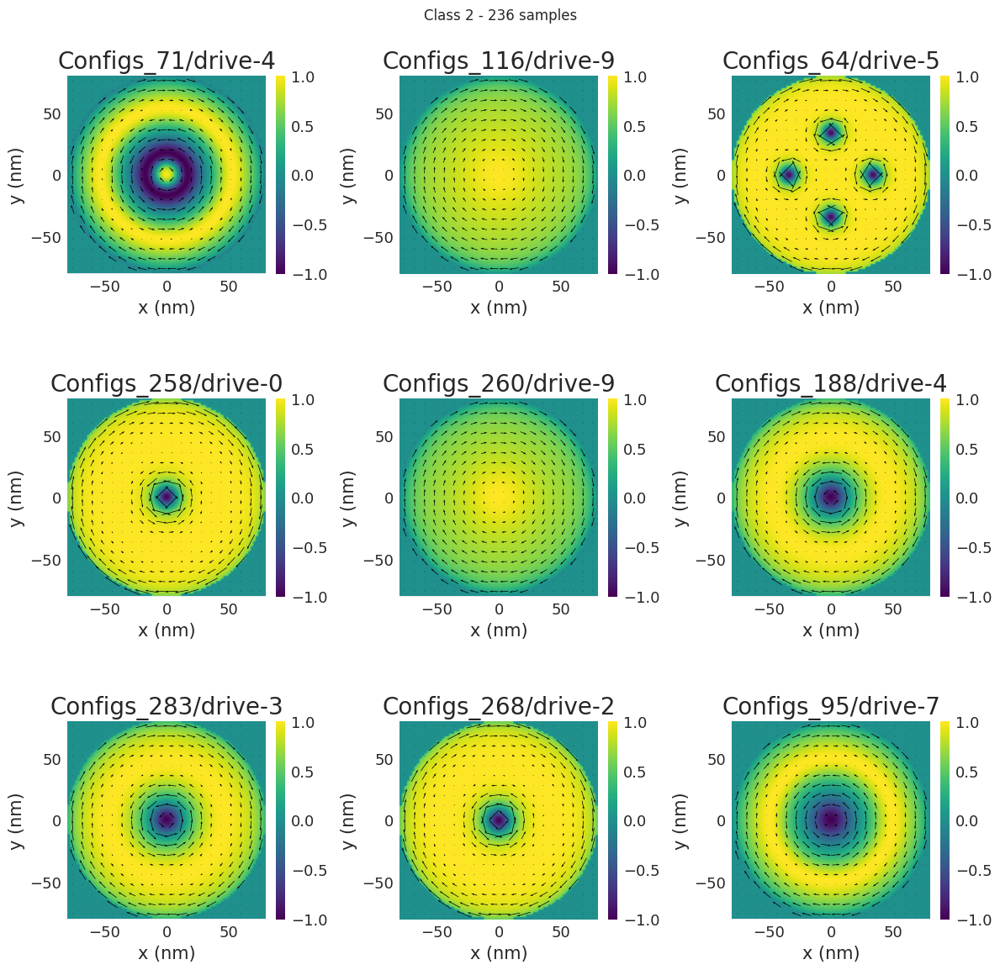

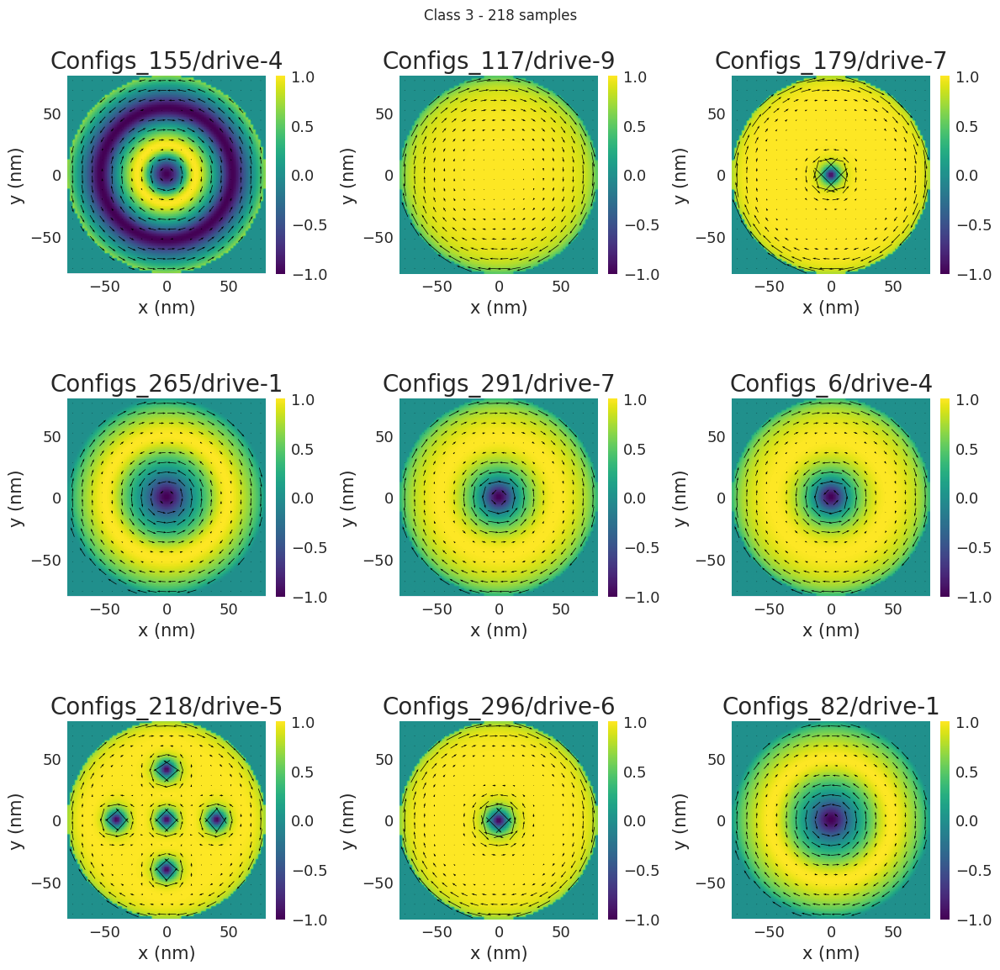

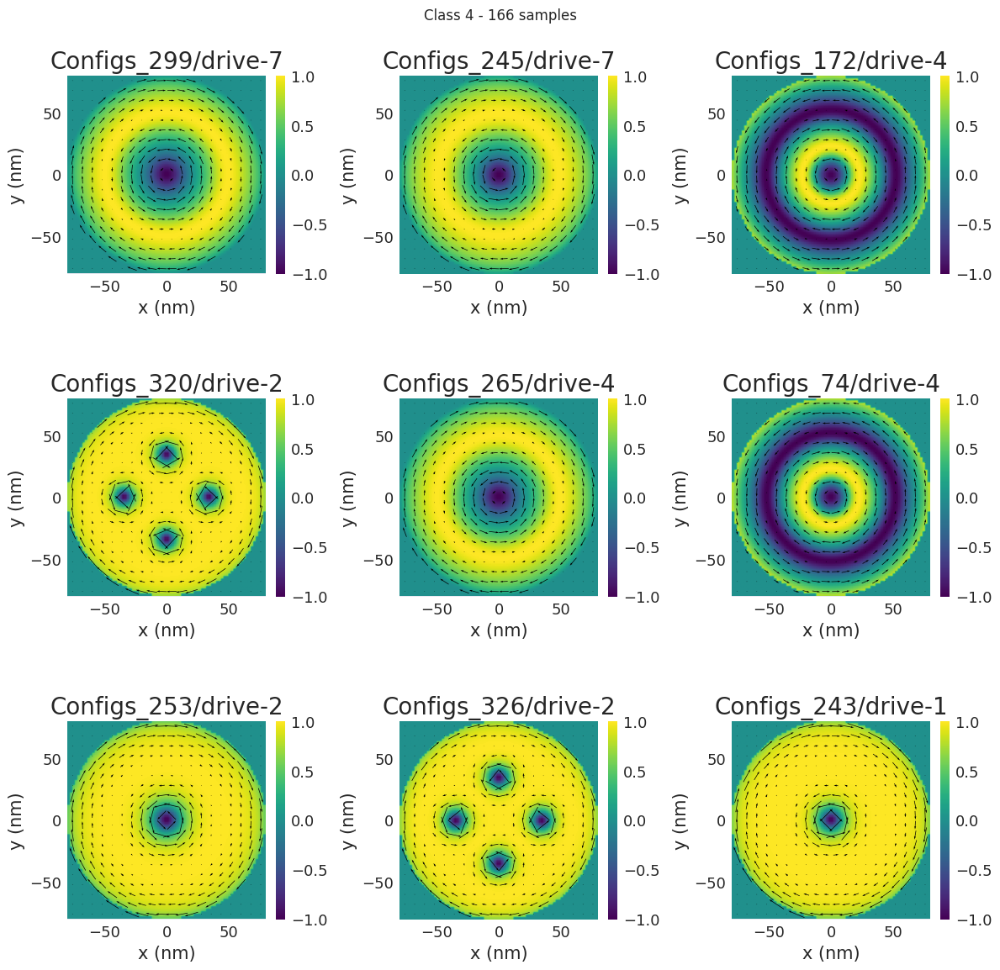

...

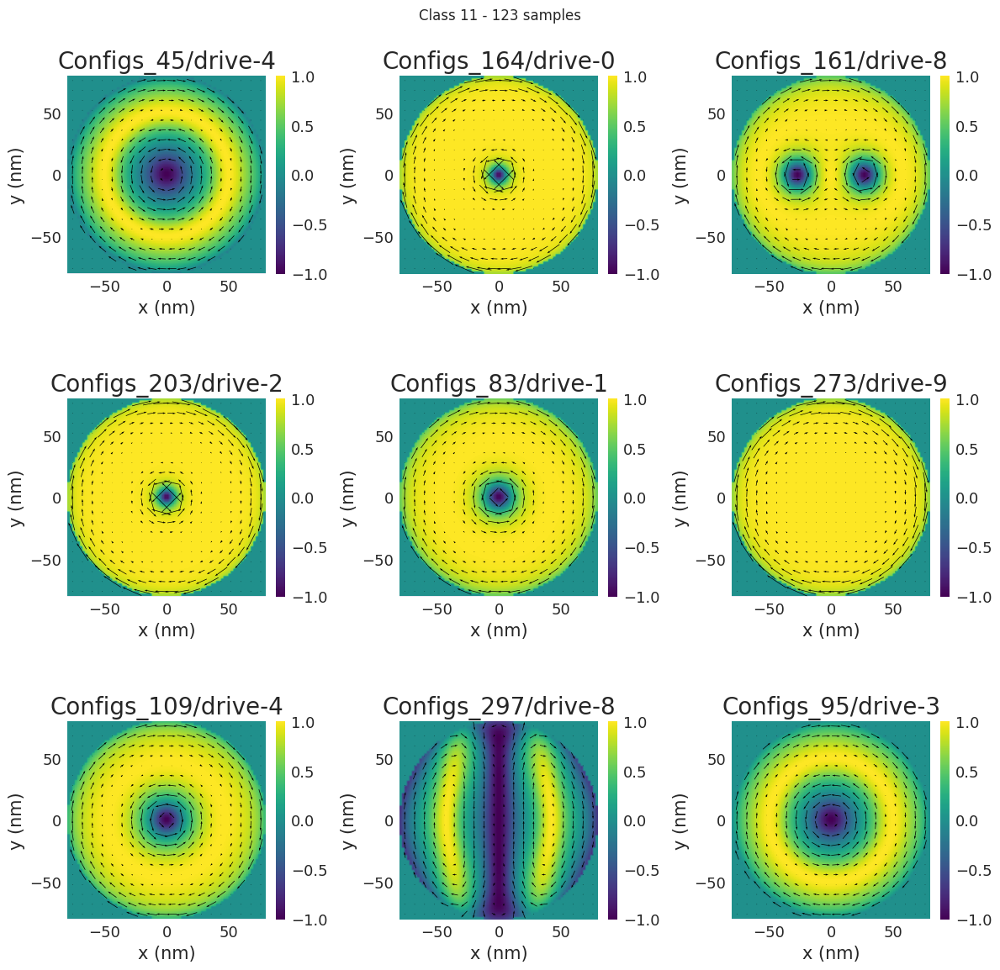

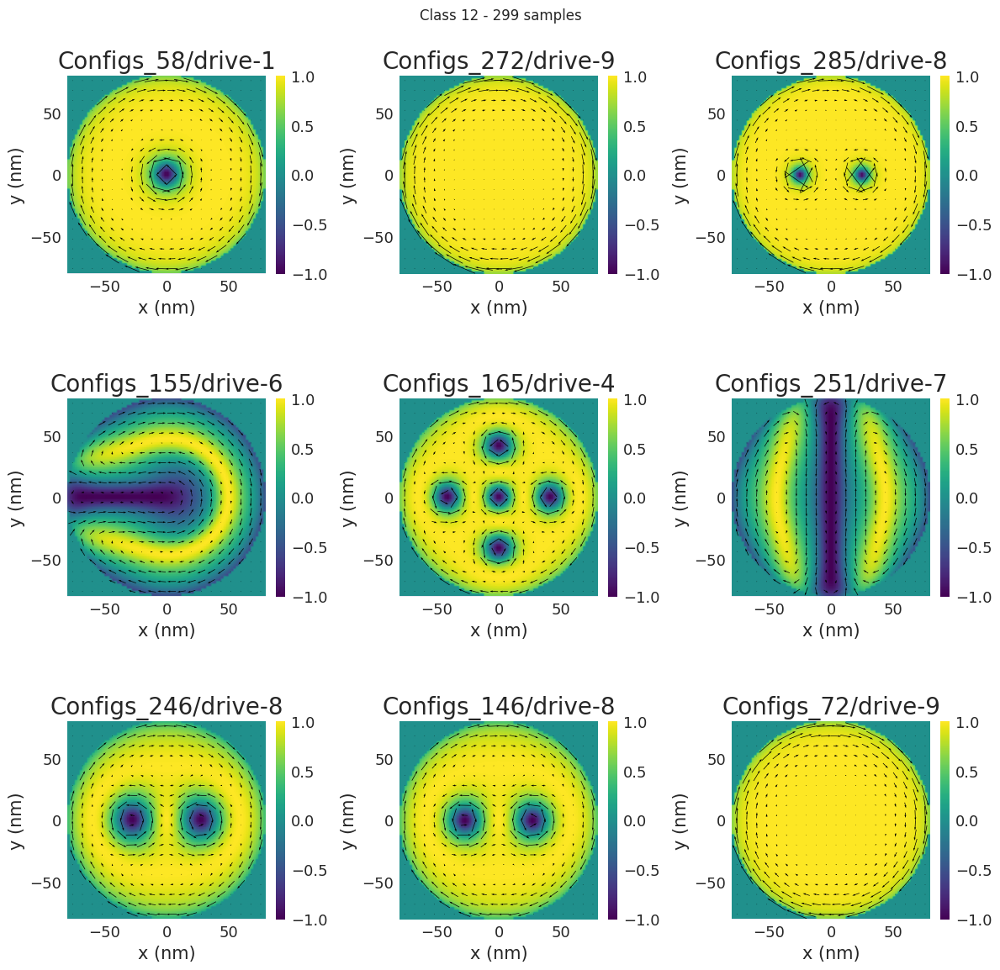

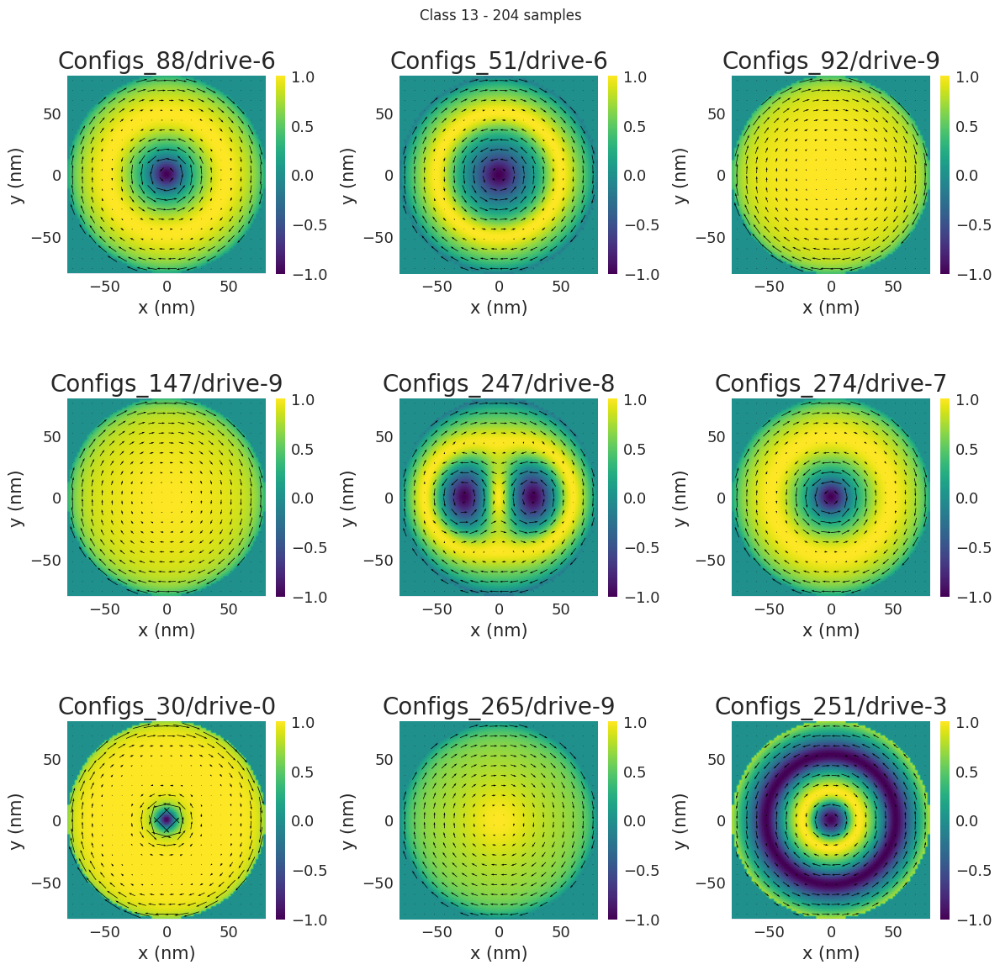

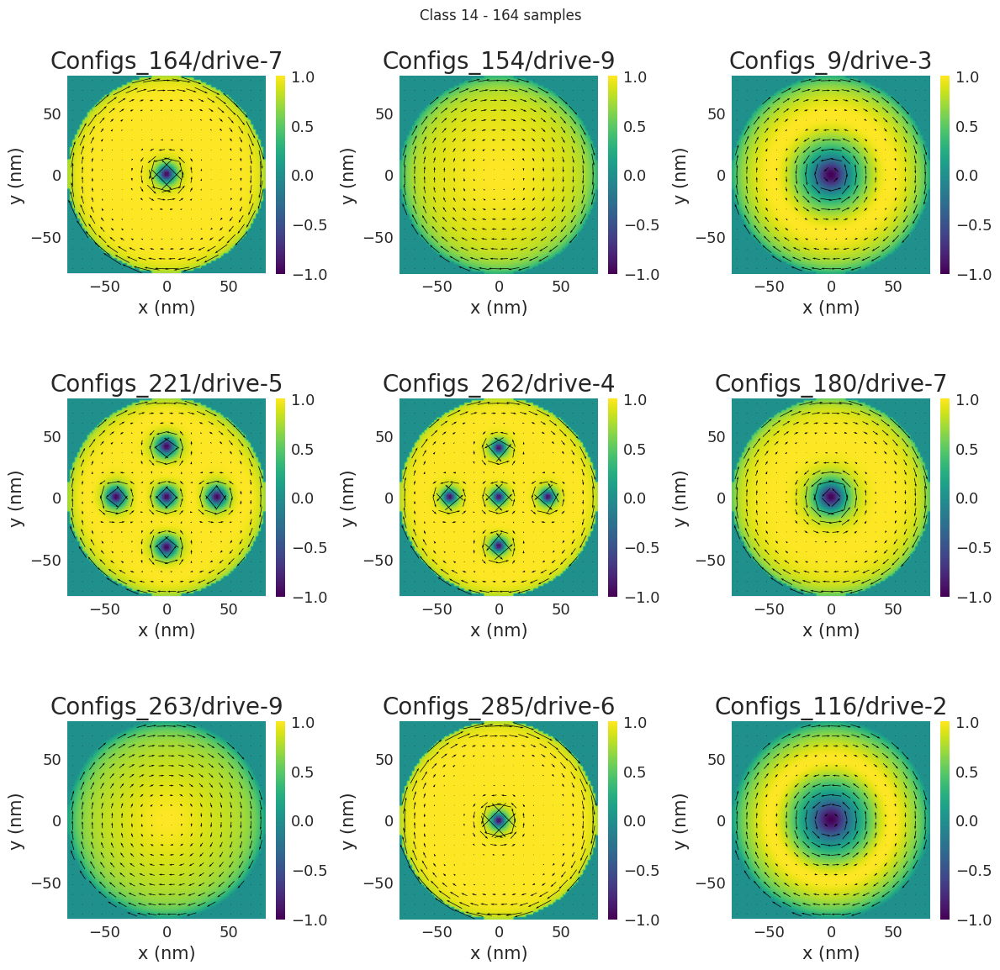

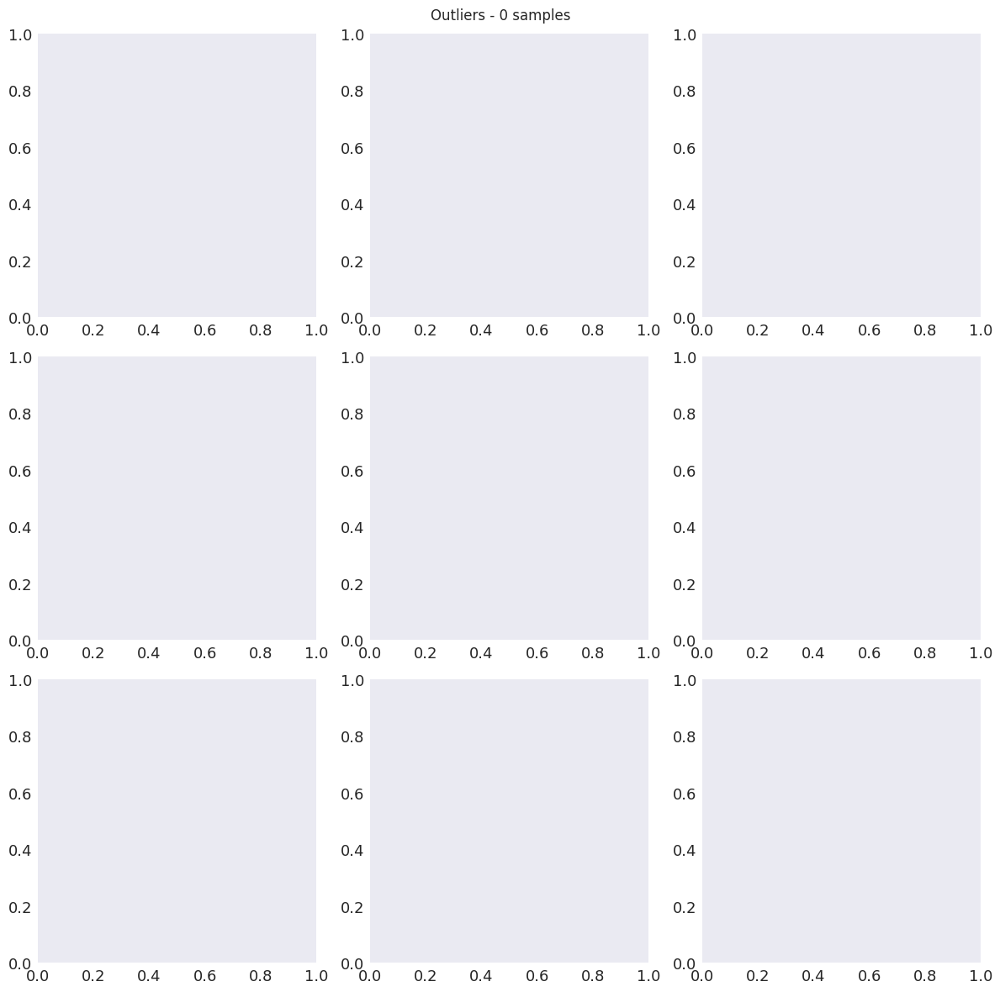

In [8]:
from plot import plot_all_examples
plot_all_examples(labels)